# Mastering Scene Understanding: Scene Graphs to the Rescue
## Two-Stage Scene Graph Generation
-----


## Clone the SSG Repository from [Boris Knyaze](https://github.com/bknyaz/sgg).

The repository accompanies two papers:

*   Graph Density-Aware Losses for Novel Compositions in Scene Graph Generation (BMVC2020)
*   Generative Compositional Augmentations for Scene Graph Prediction (ICCV2021)

In [1]:
import os
# cloning SSG
if os.path.isdir('sgg')==False:
    !git clone https://github.com/bknyaz/sgg.git
os.chdir('sgg')

Cloning into 'sgg'...


## Download Datasets
*   Visual Genome
*   GQA


In [2]:
if not os.path.exists("data"):
  !python lib/download.py data

## Show a Random Image from the Dataset

data\VG/VG_100K/2412970.jpg



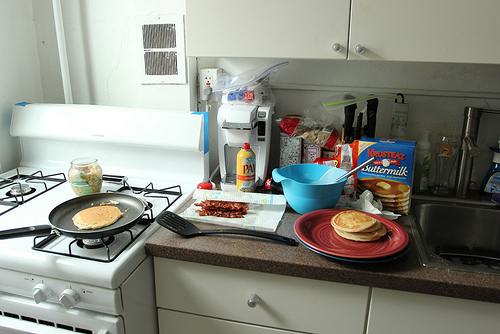

In [3]:
import random
from PIL import Image
from IPython.display import display

data_dir = "data"
VG_images_path = os.path.join(data_dir, "VG/VG_100K/")
random_img = random.choice(os.listdir(VG_images_path))
img_path = os.path.join(VG_images_path, random_img)
print(img_path)
print()
img = Image.open(img_path)
display(img)

## Train the SGG Model

Fine-tune Mask R-CNN on GQA. Code adapted from pretrain_detector.py.

In [4]:
import sys
import torch
import torchvision
import detector.utils as utils
import detector.transforms as T

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from detector.engine import train_one_epoch
from dataloaders.visual_genome import VG
from lib.pytorch_misc import save_checkpoint, get_smallest_lr
from config import BOX_SCALE

# creates the path to save the fine-tuned model
save_dir = "results/pretrain_GQA"
if not os.path.exists(save_dir):
    if len(save_dir) == 0:
        raise ValueError("save_dir must be a valid path")
    os.makedirs(save_dir)

# dataloader for the dataset
class VGLoader(VG):
    def __init__(self, mode, data_dir, transforms):
        super(VGLoader, self).__init__(mode, data_dir, num_val_im=5000, filter_duplicate_rels=True,
                                            min_graph_size=-1,
                                            max_graph_size=-1,
                                            filter_non_overlap=False)
        self.transforms = transforms


    def __getitem__(self, idx):
        index = idx

        img = Image.open(os.path.join(self.images_dir, self.filenames[index])).convert('RGB')
        w, h = img.size

        gt_boxes = self.gt_boxes[index].copy()

        if VG.split == 'stanford':
            # makes boxes scale the same as images
            gt_boxes = gt_boxes / (BOX_SCALE / max(w, h))

        if self.is_train:
            # crop boxes that are too large.
            gt_boxes[:, [1, 3]] = gt_boxes[:, [1, 3]].clip(None, h)
            gt_boxes[:, [0, 2]] = gt_boxes[:, [0, 2]].clip(None, w)

        if VG.split in ['vte', 'gqa']:
            # width, height can become zero after clipping (need to double-check why)
            ind_zero = (gt_boxes[:, 2] - gt_boxes[:, 0]) == 0 & (gt_boxes[:, 0] > 0)  # x1 == x2 and x1 > 0
            gt_boxes[ind_zero, 0] -= 1
            ind_zero = (gt_boxes[:, 3] - gt_boxes[:, 1]) == 0 & (gt_boxes[:, 1] > 0)  # y1 == y2 and y1 > 0
            gt_boxes[ind_zero, 1] -= 1

        gt_boxes = torch.as_tensor(gt_boxes, dtype=torch.float32)

        target = {}
        target["boxes"] = gt_boxes
        target["labels"] = torch.from_numpy(self.gt_classes[index]).long()
        # target["masks"] = masks  # no mask annotations
        target["image_id"] = torch.tensor([idx])
        target["area"] = (gt_boxes[:, 3] - gt_boxes[:, 1]) * (gt_boxes[:, 2] - gt_boxes[:, 0])
        target["iscrowd"] = torch.zeros((len(self.gt_classes[index]),), dtype=torch.int64)  # suppose all instances are not crowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target


def get_model_optimizer(num_classes):
    # load an instance segmentation model pre-trained pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    model.roi_heads.mask_predictor = None  # no masks in these datasets

    # construct an optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005,  # didn't tune these values but looks good
                                momentum=0.9, weight_decay=0.0005)

    start_epoch = -1
    if os.path.exists(checkpoint_name):
        print('loading the model and optimizer state from %s' % checkpoint_name)
        state_dict = torch.load(checkpoint_name)
        model.load_state_dict(state_dict['state_dict'])
        optimizer.load_state_dict(state_dict['optimizer'])
        start_epoch = state_dict['epoch']

    return model, optimizer, start_epoch


def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)


checkpoint_name = "" #empty to train from scratch


def train():
    # train on the GPU or on the CPU, if a GPU is not available
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    # our dataset has two classes only - background and person
    num_classes = 151 if VG.split == 'stanford' else 1704

    # use our dataset and defined transformations
    dataset = VGLoader('train', data_dir, get_transform(train=True))
    # dataset_test = GQALoader('val', get_transform(train=False))

    # define training and validation data loaders
    data_loader = torch.utils.data.DataLoader(
        dataset, batch_size=3 if VG.split == 'stanford' else 2, shuffle=True, num_workers=4,
        collate_fn=utils.collate_fn)

    # data_loader_test = torch.utils.data.DataLoader(
    #     dataset_test, batch_size=1, shuffle=False, num_workers=4,
    #     collate_fn=utils.collate_fn)

    # get the model using our helper function
    model, optimizer, start_epoch = get_model_optimizer(num_classes)
    print('start_epoch', start_epoch)

    # move model to the right device
    model.to(device)

    # and a learning rate scheduler
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                   step_size=3,
                                                   gamma=0.1)
    # let's train it for 10 epochs
    num_epochs = 10

    for epoch in range(start_epoch + 1, num_epochs):
        print('\nepoch %d, smallest lr %f\n' % (epoch, get_smallest_lr(optimizer)))
        # train for one epoch, printing every 10 iterations
        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)

        try:
            print("\nCheckpointing to %s" % os.path.join(save_dir, checkpoint_name))
            save_checkpoint(model, optimizer, os.path.join(save_dir, checkpoint_name), {'epoch': epoch})
            print('done!\n')
        except Exception as e:
            print('error saving checkpoint', e)

        # update the learning rate
        lr_scheduler.step(epoch)
        # evaluate on the test dataset
        # evaluate(model, data_loader_test, device=device)  # some issues with evaluation (check coco_eval code)

    print("That's it!")

c:\Users\carlo\micromamba\envs\teste4_jSGG\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
train()

subj_pred_pairs, pred_obj_pairs 3397 3542
57723 images, 405860 triplets (29283 unique triplets)
Stats: 670591 objects (min=2.0, max=62.0, mean=11.6, std=5.8), 297318 FG edges (min=1.0, max=44.0, mean=5.2, std=3.8), 9029910 BG edges (156.44 avg), graph density min=0.0, max=100.0, mean=6.5, std=8.2
start_epoch -1

epoch 0, smallest lr 0.005000



## Evaluate SSG Model

Load GQA data.

In [6]:
import numpy as np
import subprocess
import pandas as pd
import time
import pickle
import cv2
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict
from config import IM_SCALE
from dataloaders.visual_genome import VGDataLoader, VG

VG.split = 'gqa'  # set VG, GQA or VTE split here to use as a global variable
checkpoint_path = os.path.join(save_dir, "gqa_maskrcnn_res50fpn.pth")  # 'gqa_sggen_62566.pth'
mode = 'sgdet'
device = 'cpu' # or gpu
num_gpus = 1
backbone = 'resnet50'

# should be loaded after settings some params
from lib.pytorch_misc import *
from lib.sgg_eval import BasicSceneGraphEvaluator, calculate_mR_from_evaluator_list, eval_entry
from lib.eval import val_epoch
from sgg_models.rel_model_stanford import RelModelStanford

# Load GQA data
train_loader, eval_loaders = VGDataLoader.splits(data_dir=data_dir,
                                                 batch_size=1,
                                                 num_workers=0,
                                                 backbone=backbone,
                                                 square_pad=False,
                                                 filter_non_overlap=mode=='sgdet',
                                                 is_cuda=False)


Loading the GQA split of Visual Genome

TRAIN DATASET
Loading GQA-train image ids...
Loading GQA-train scene graphs...
train 67140
subj_pred_pairs, pred_obj_pairs 23472 22572
66078 images, 3455468 triplets (470129 unique triplets)
Stats: 1120047 objects (min=2.0, max=126.0, mean=17.0, std=7.8), 3392073 FG edges (min=1.0, max=1656.0, mean=51.3, std=55.4), 21897664 BG edges (331.39 avg), graph density min=0.5, max=100.0, mean=16.8, std=9.6
loading the original training split first
Loading GQA-train image ids...
train 67140
subj_pred_pairs, pred_obj_pairs 23472 22572
66078 images, 3455468 triplets (470129 unique triplets)
Stats: 1120047 objects (min=2.0, max=126.0, mean=17.0, std=7.8), 3392073 FG edges (min=1.0, max=1656.0, mean=51.3, std=55.4), 21897664 BG edges (331.39 avg), graph density min=0.5, max=100.0, mean=16.8, std=9.6

VAL DATASET (ZERO-SHOTS)
Loading GQA-val image ids...
val 5000
3025 images, 23371 triplets (18638 unique triplets)
Stats: 61192 objects (min=2.0, max=71.0, mean

Load checkpoiunt model.

In [7]:
sgg_model = RelModelStanford(train_data=train_loader.dataset,
                             mode=mode,
                             backbone=backbone,
                             RELS_PER_IMG=1024,
                             min_size=800,
                             max_size=1333,
                             edge_model='raw_boxes')
                                                 

print("Loading EVERYTHING from %s" % checkpoint_path)
ckpt = torch.load(checkpoint_path, map_location='cpu')
success = optimistic_restore(sgg_model, ckpt['state_dict'])
sgg_model.detector.eval()
assert success, 'something wrong when loading the detector'
sgg_model.to(device)
sgg_model.eval()
sgg_model.detector.eval()
sgg_model.detector.mode = 'refinerels' if mode == 'sgdet' else 'gtbox'
print('done')


Loading COCO pretrained model maskrcnn_resnet50_fpn...

sgdet resnet50 1024 False False True
Loading EVERYTHING from results/pretrain_GQA\gqa_maskrcnn_res50fpn.pth
detector restored -  success (303 keys)
done


Let's visualize ground truth and predictions for a bunch of test images


Evaluate TEST_ALLS test triplets

Evaluating SGDET...
setting refinerels mode for detector


  0%|          | 0/10055 [00:00<?, ?it/s]c:\Users\carlo\micromamba\envs\teste4_jSGG\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
c:\Users\carlo\micromamba\envs\teste4_jSGG\lib\site-packages\torch\nn\functional.py:3981: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


1001.jpg showing ground truth


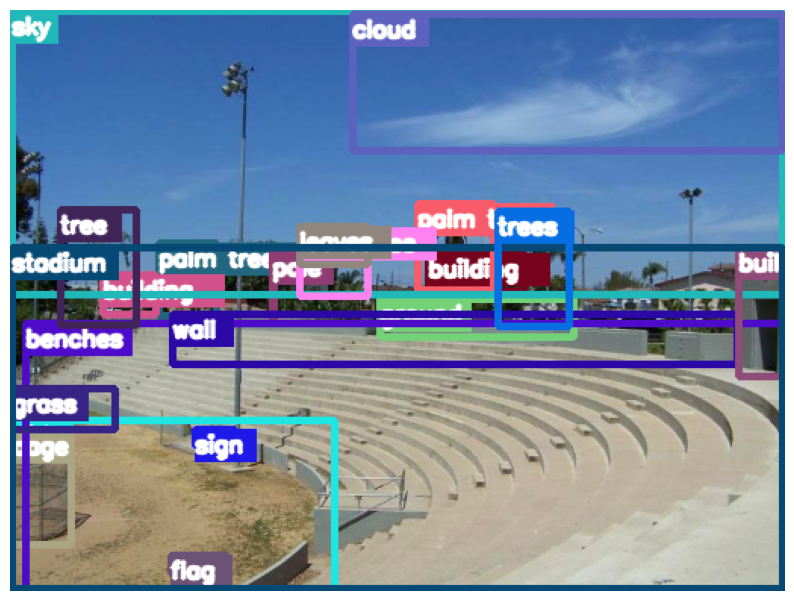

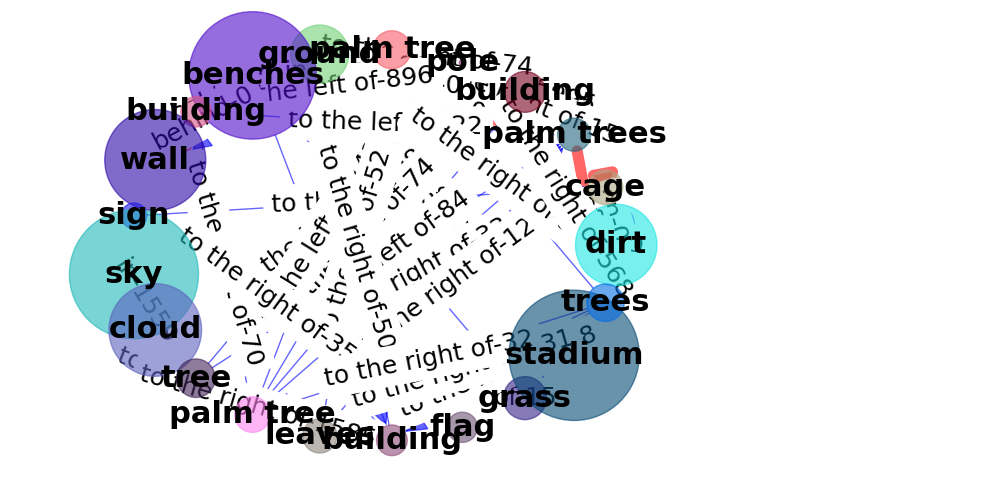

1001.jpg showing top 50 relationships


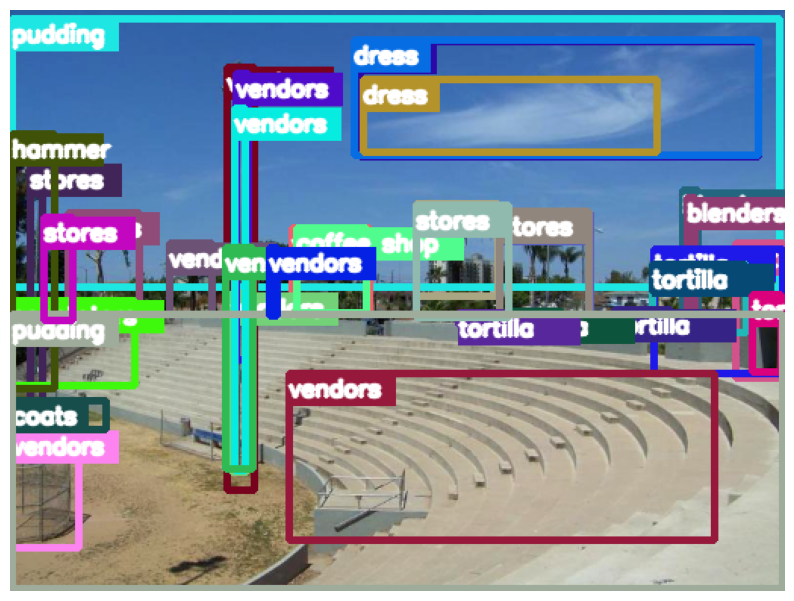

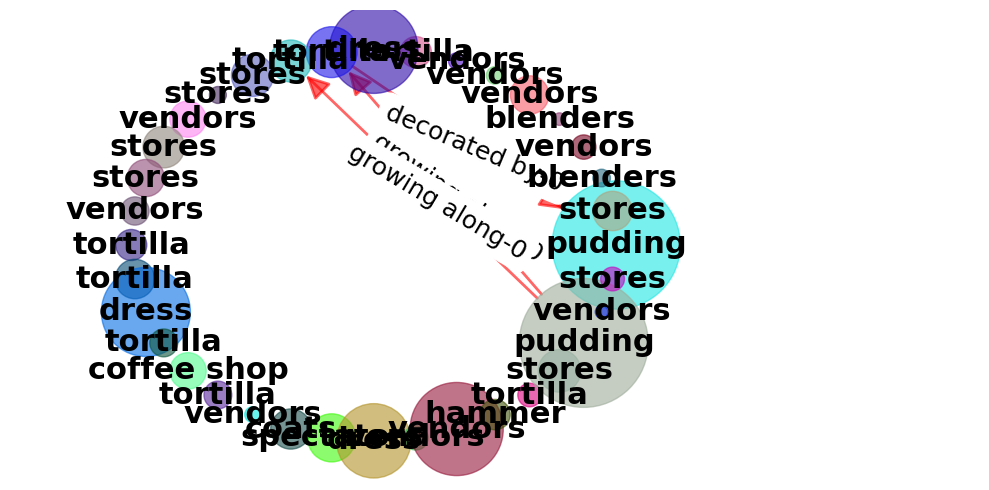

  0%|          | 1/10055 [00:04<12:05:12,  4.33s/it]

1016.jpg showing ground truth


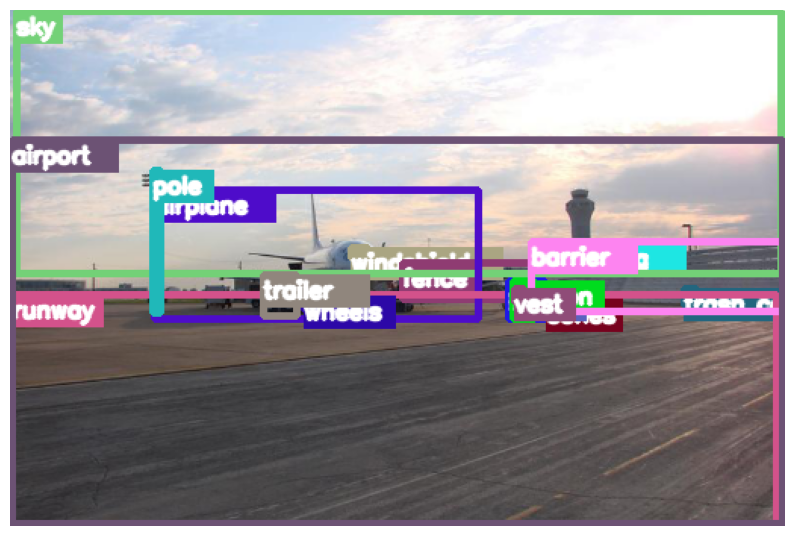

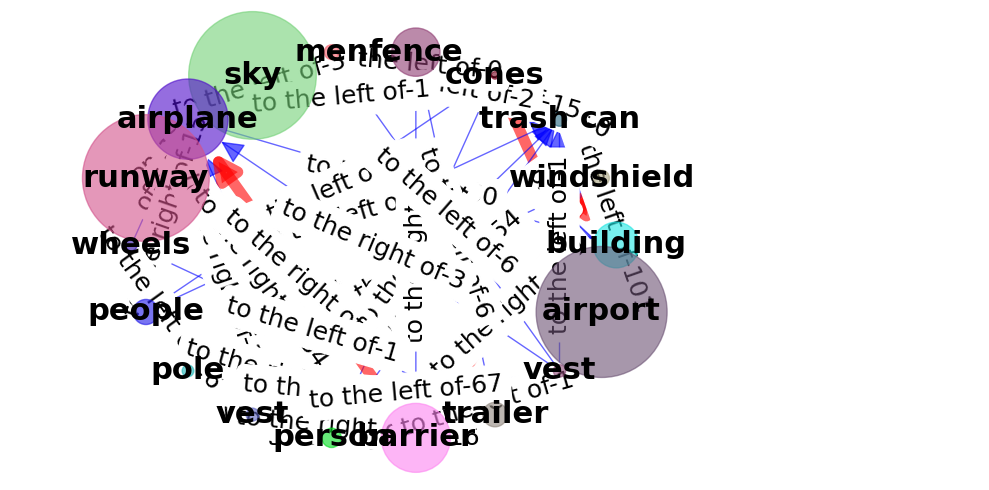

1016.jpg showing top 50 relationships


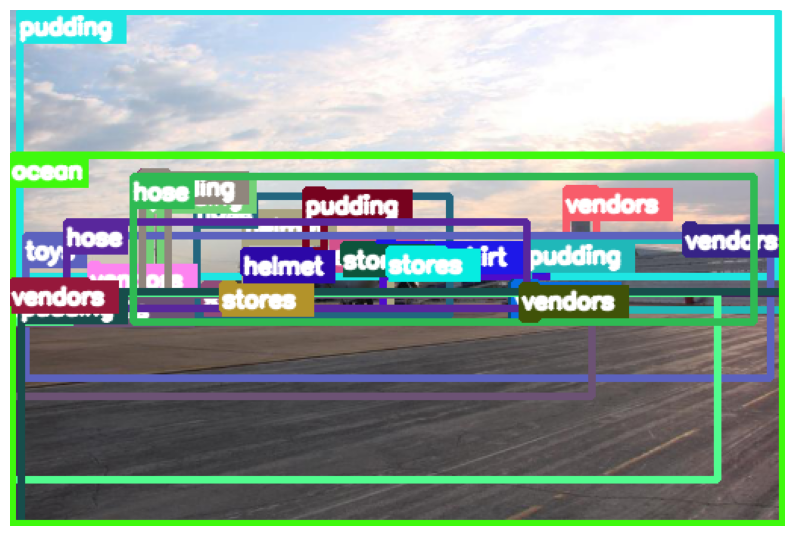

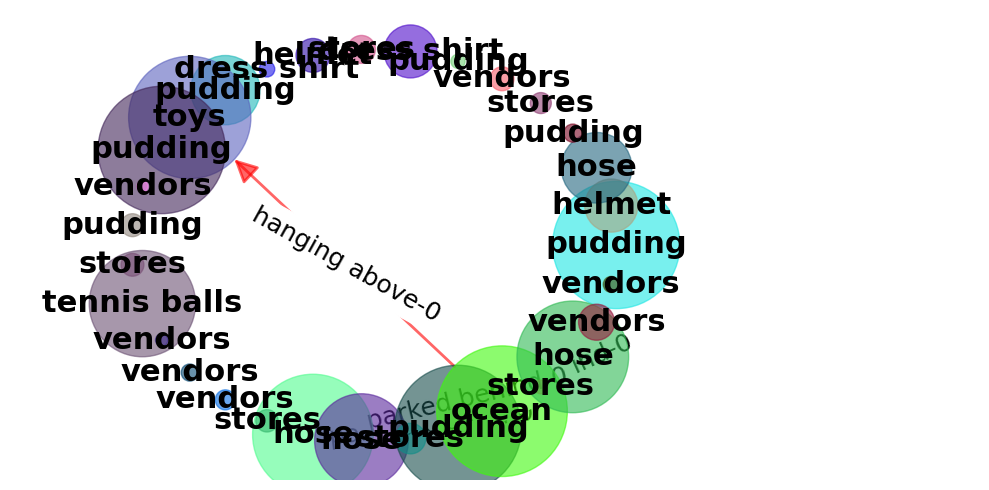

  0%|          | 2/10055 [00:09<13:21:55,  4.79s/it]

1054.jpg showing ground truth


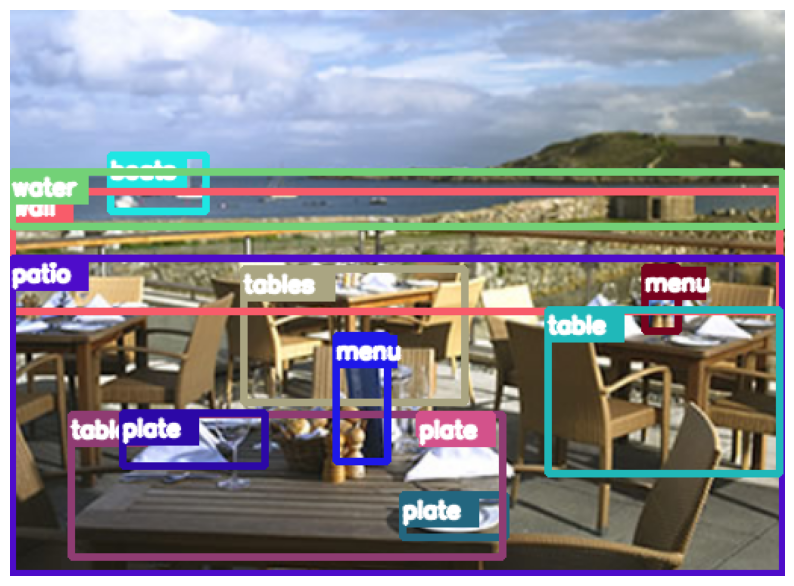

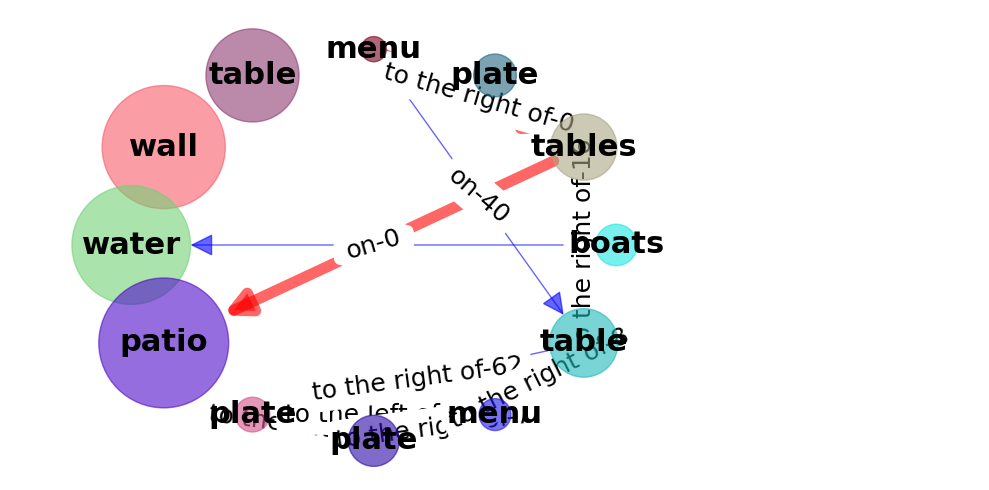

1054.jpg showing top 50 relationships


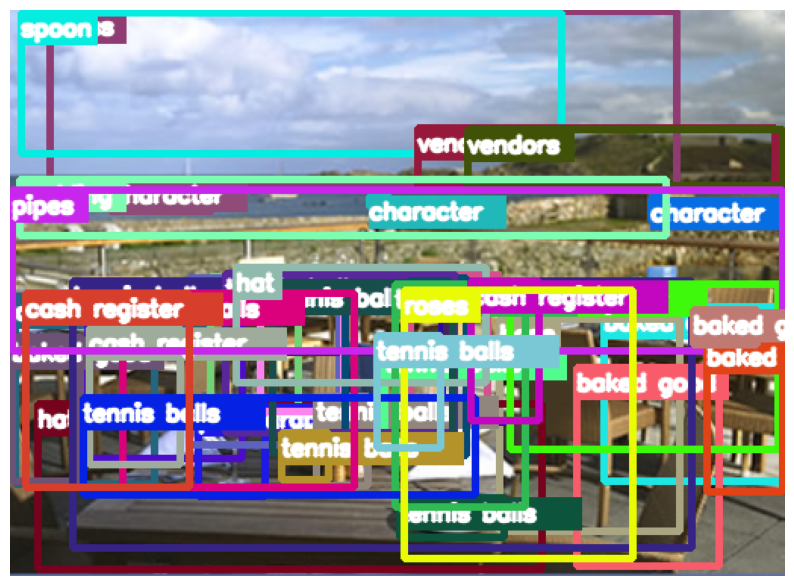

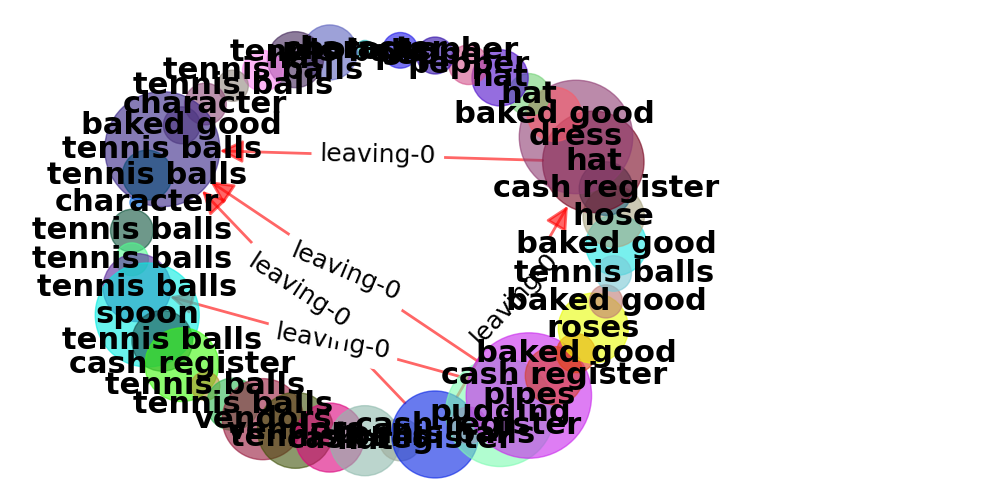

  0%|          | 3/10055 [00:13<12:48:29,  4.59s/it]

1057.jpg showing ground truth


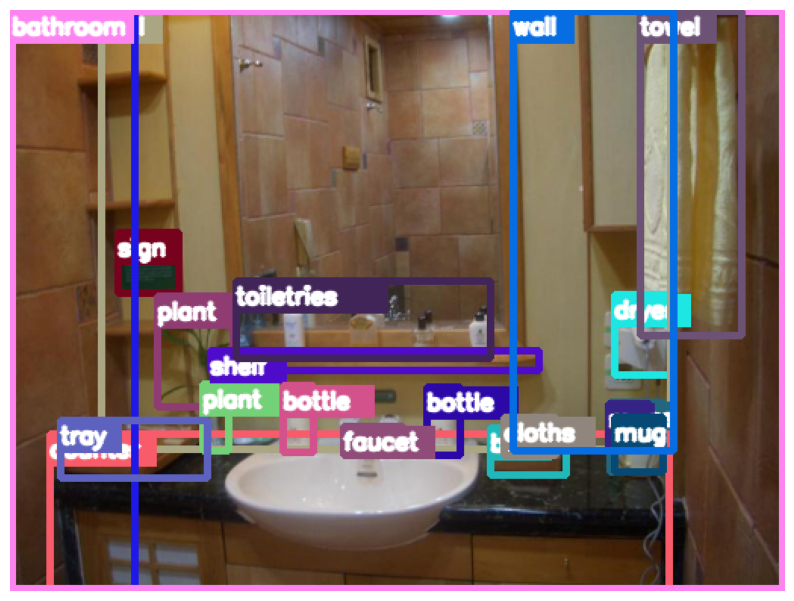

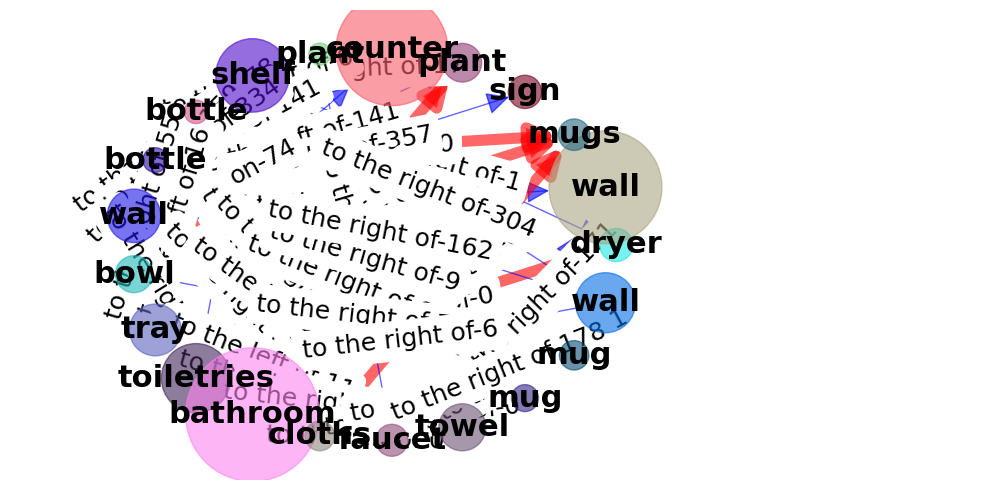

1057.jpg showing top 50 relationships


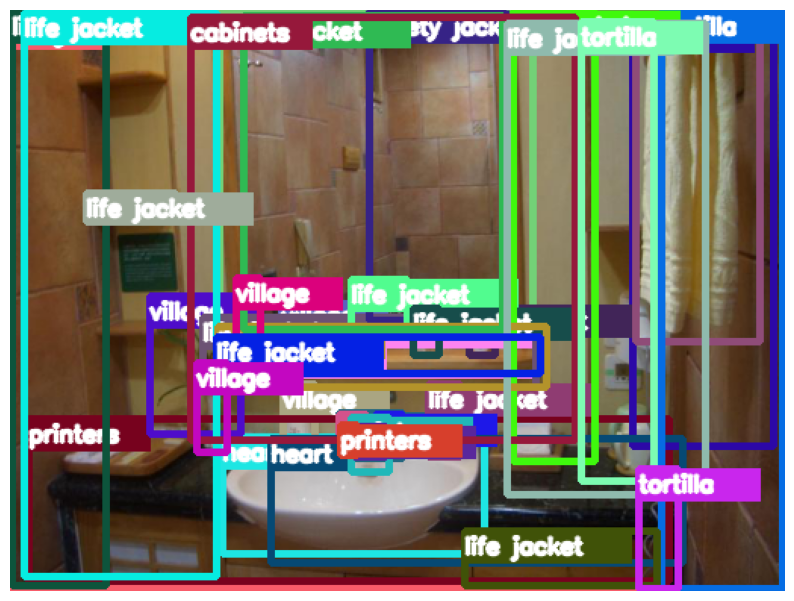

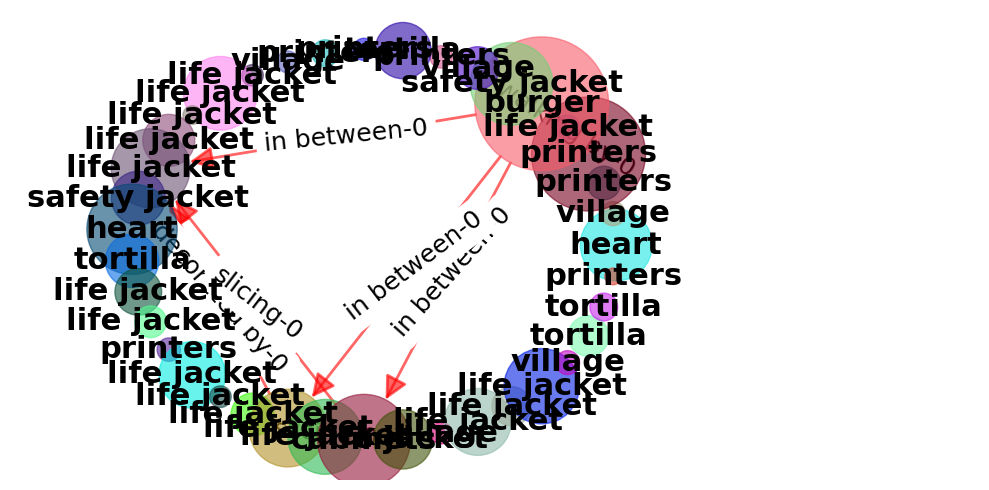

  0%|          | 4/10055 [00:18<13:12:02,  4.73s/it]

1058.jpg showing ground truth


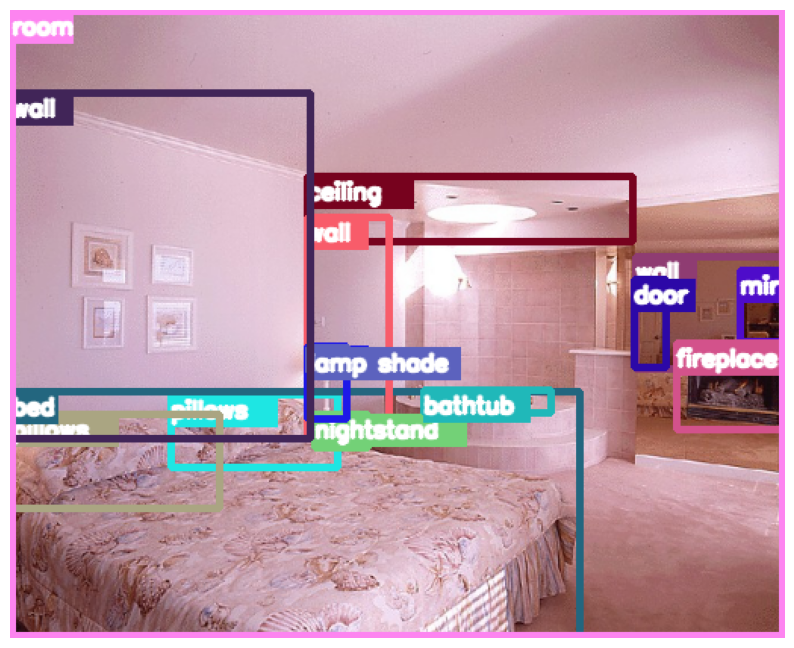

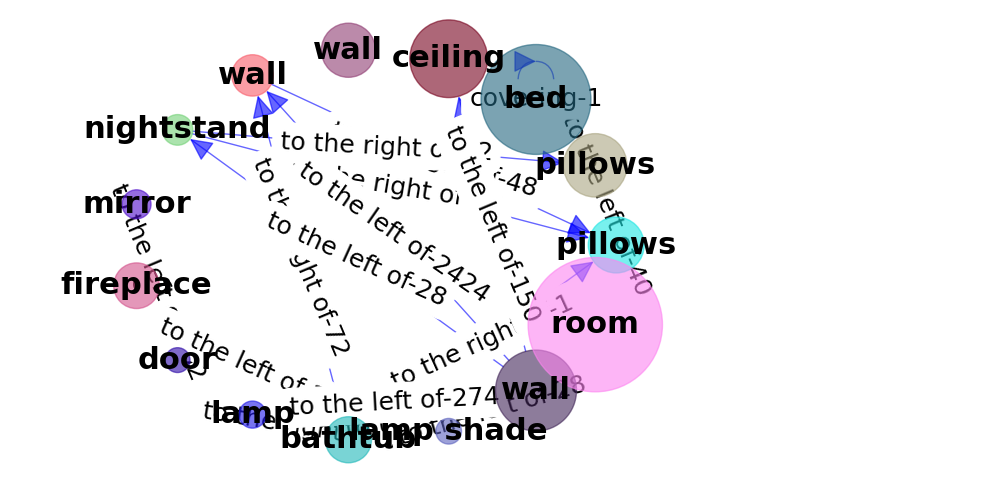

1058.jpg showing top 50 relationships


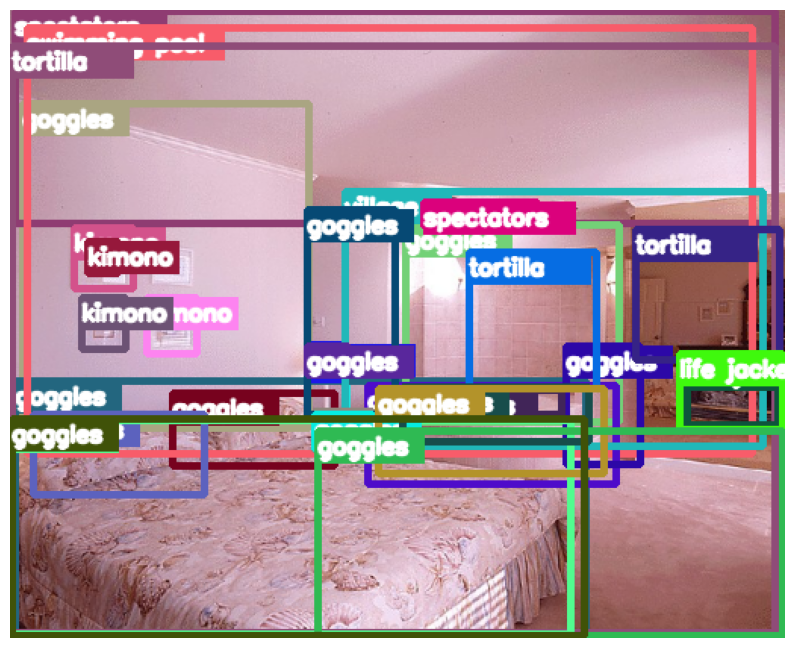

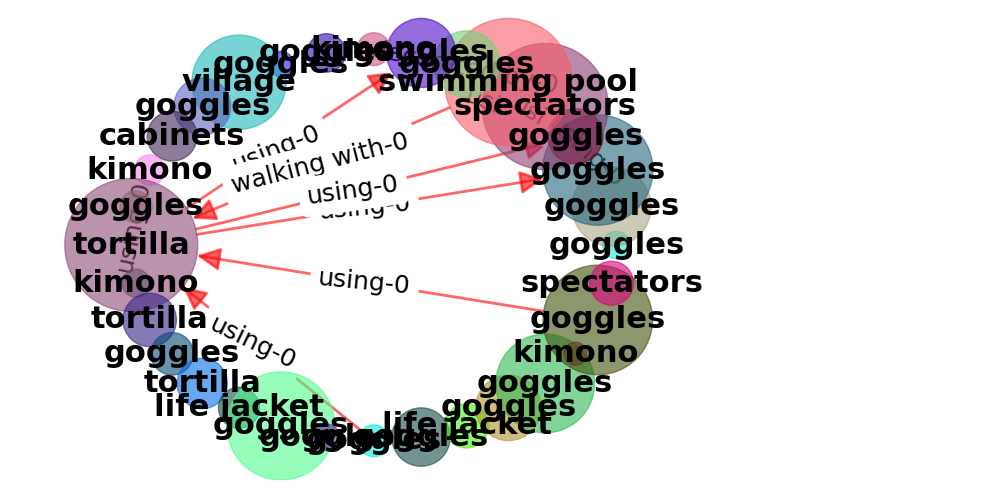

  0%|          | 5/10055 [00:23<12:53:02,  4.62s/it]

1066.jpg showing ground truth


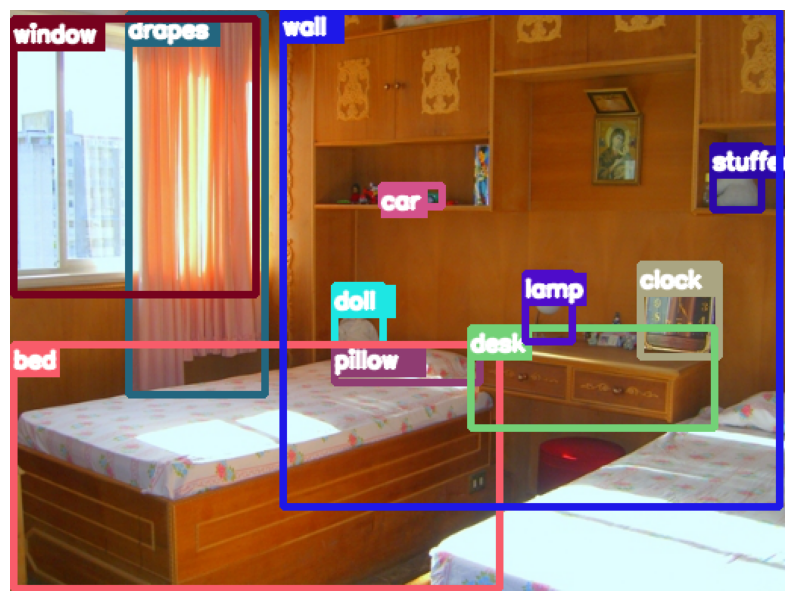

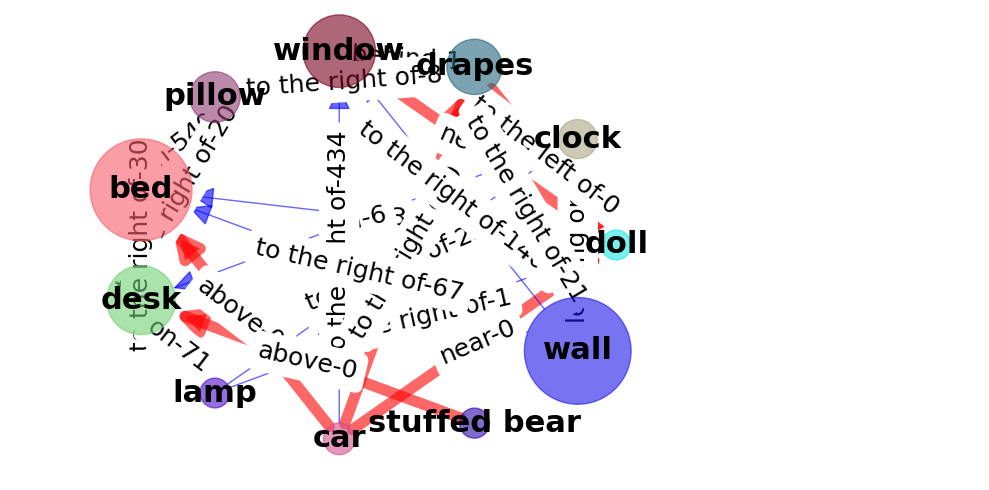

1066.jpg showing top 50 relationships


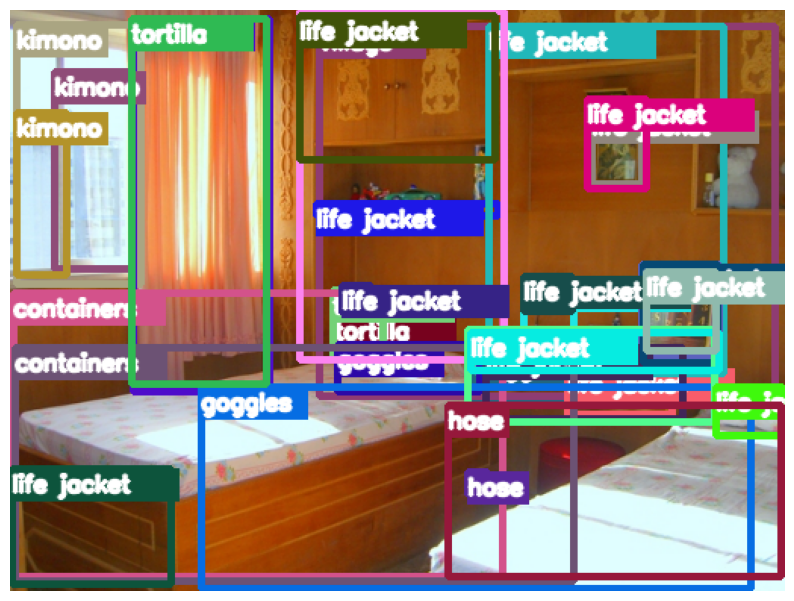

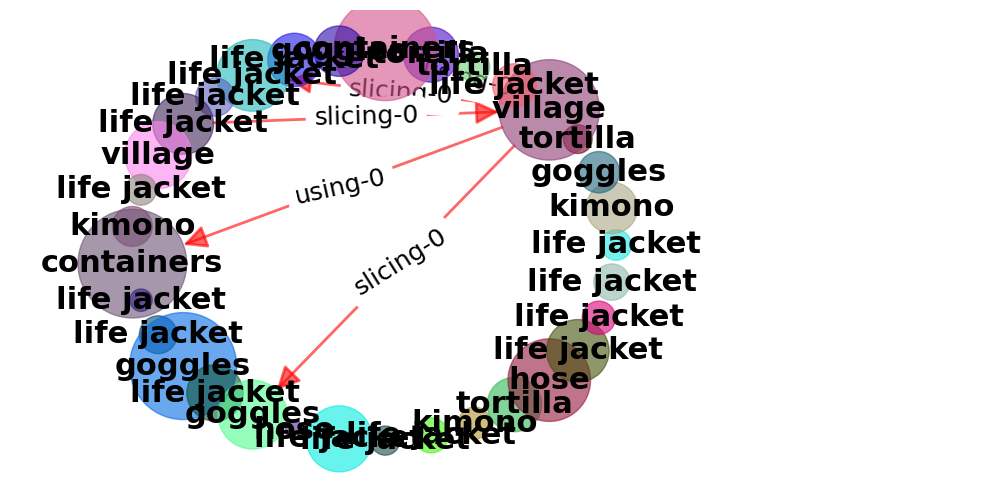

  0%|          | 7/10055 [00:33<13:10:02,  4.72s/it]

skipping a scene graph with too many objects
1074.jpg showing ground truth


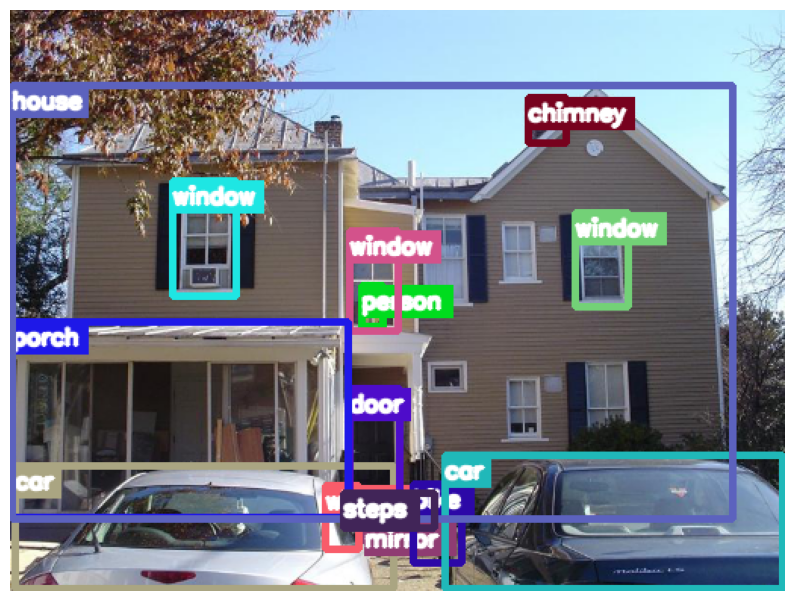

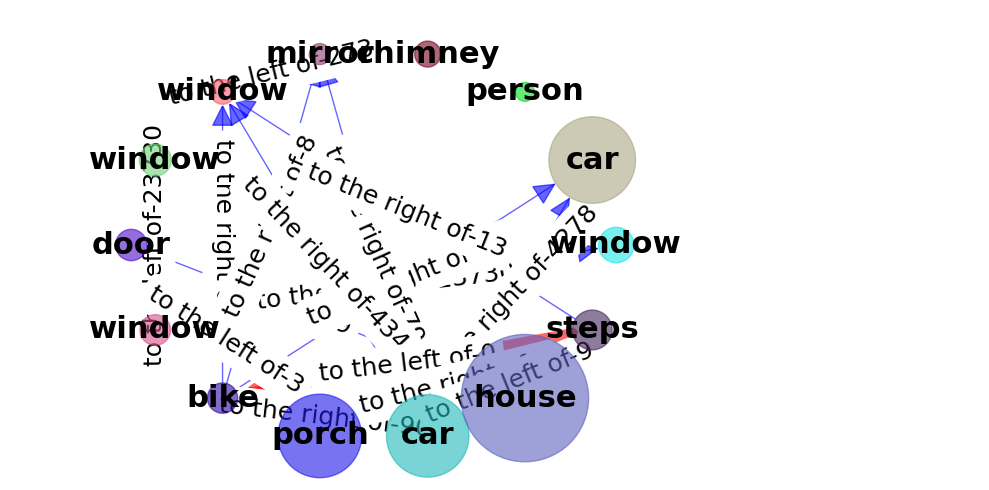

1074.jpg showing top 50 relationships


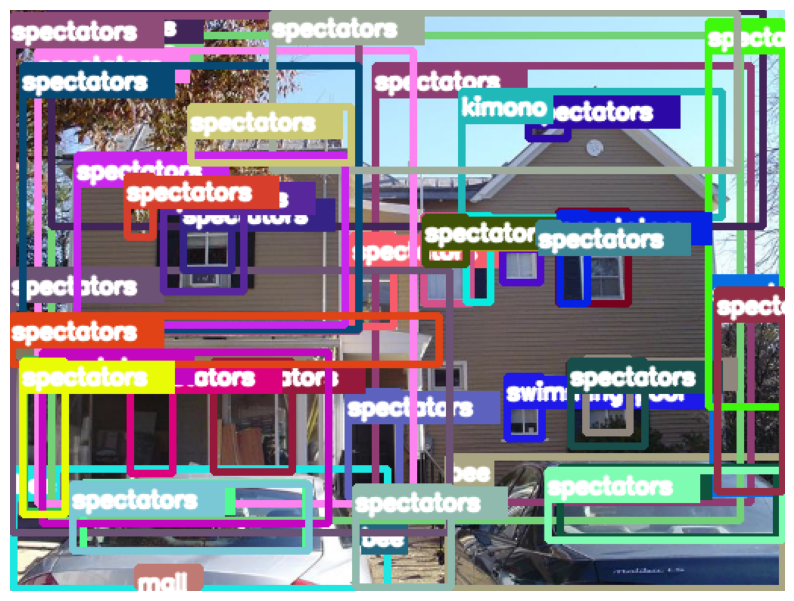

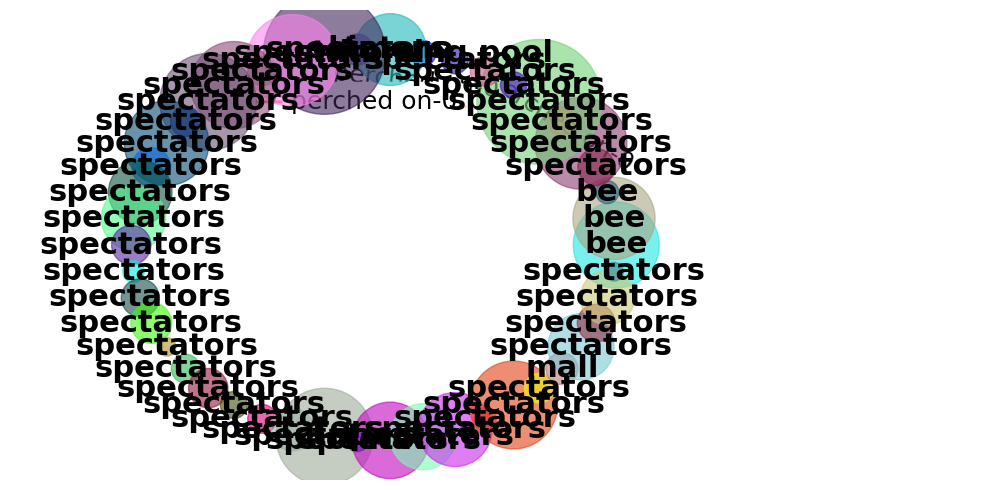

  0%|          | 8/10055 [00:38<13:22:27,  4.79s/it]

107903.jpg showing ground truth


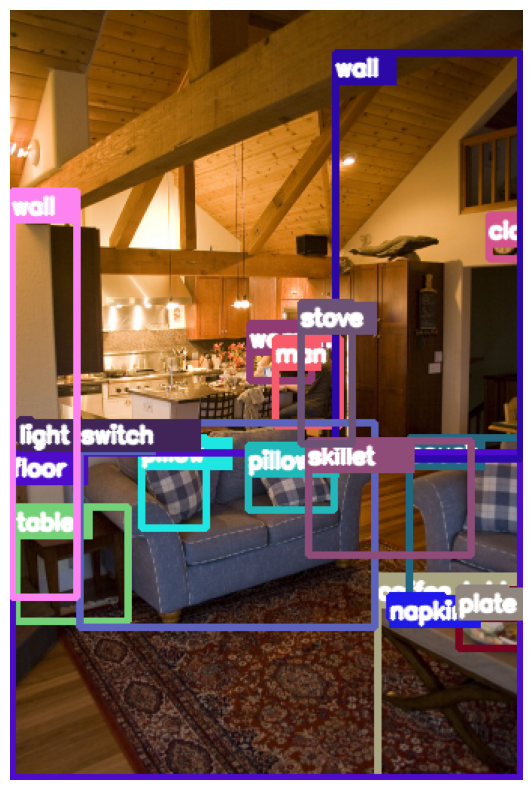

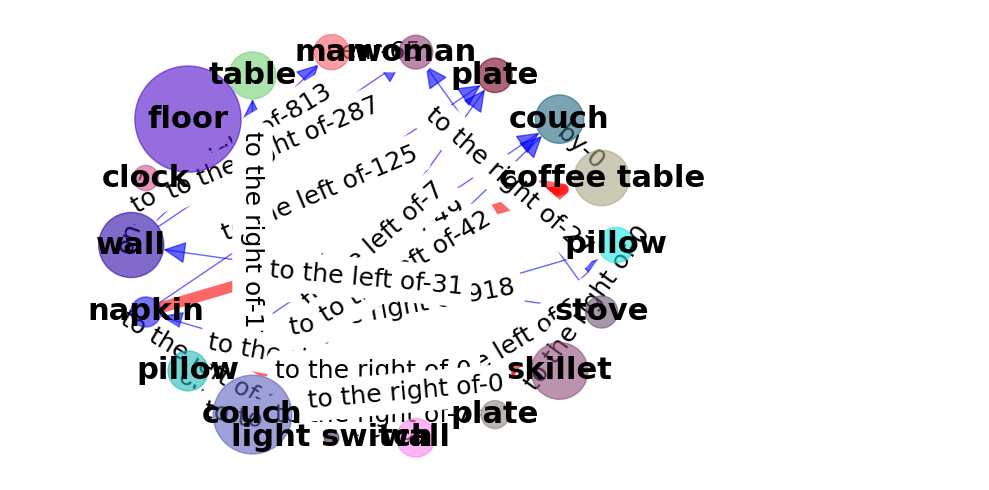

107903.jpg showing top 50 relationships


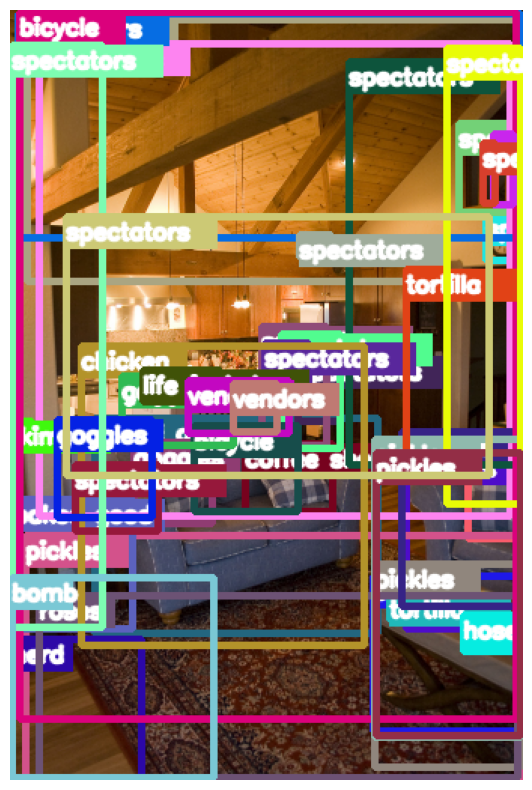

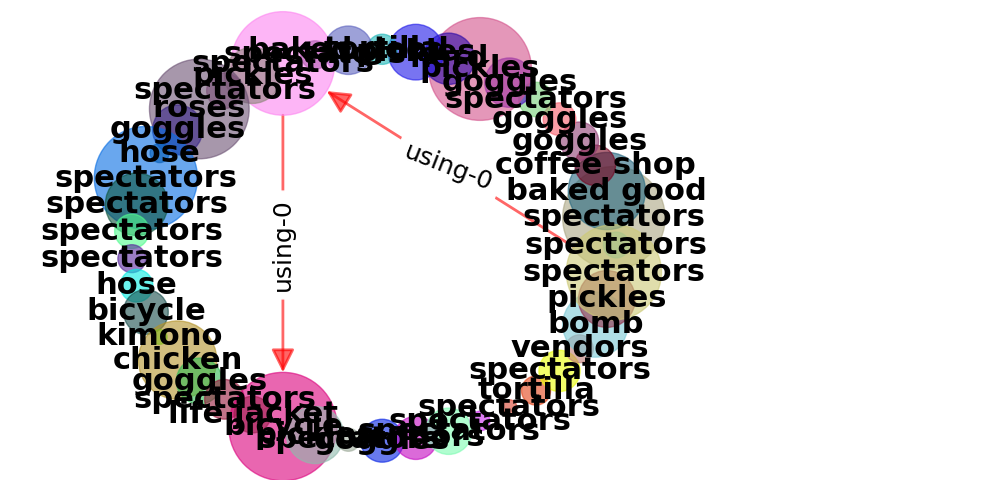

  0%|          | 9/10055 [00:47<14:35:35,  5.23s/it]

skipping a scene graph with too many objects
================sgdet(GC): 8 images ==================
R@20: 0.000000
R@50: 0.000000
R@100: 0.000000
R@200: 0.000000
R@300: 0.000000
================sgdet(NO GC): 8 images ==================
R@20: 0.000000
R@50: 0.000000
R@100: 0.000000
R@200: 0.000000
R@300: 0.000000

Triplet level evaluation (383 triplets)
Triplet level R@5: 0.0000 (normalized: 0.0000)
Triplet level R@10: 0.0000 (normalized: 0.0000)
Triplet level R@15: 0.0000 (normalized: 0.0000)
Triplet level R@20: 0.0000 (normalized: 0.0000)
Triplet level R@50: 0.0000 (normalized: 0.0000)
Triplet level mean rank: 301.0000 (normalized: 301.0000)
Triplet level median rank: 301.0000 (per class: 301.0000, normalized per class: 301.0000)



relationship:  about to hit
================sgdet(GC): 0 images ==================
R@20: nan
R@50: nan
R@100: nan
R@200: nan
R@300: nan


relationship:  above
================sgdet(GC): 2 images ==================
R@20: 0.000000
R@50: 0.000000
R@100: 0.000


c:\Users\carlo\micromamba\envs\teste4_jSGG\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\carlo\micromamba\envs\teste4_jSGG\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


{'sgdet': []}

In [8]:
# Let's visualize ground truth and predictions for a bunch of test images
eval_split = 'test_alls'
val_epoch(mode, sgg_model, 
          eval_loaders[eval_split], 
          eval_split,
          train_loader.dataset.triplet_counts,
          train_loader.dataset.triplet2str,
          is_test=True, 
          vis=True, n_batches=10, max_obj=30, max_rels=50, 
          train=train_loader.dataset, test_zs=eval_loaders['test_zs'].dataset)